This kernel shows how to check your prediction with map and train data.

I used some nice functions and data from public kernels, thanks @kenmatsu4 and @hiro5299834
* https://www.kaggle.com/kenmatsu4/feature-store-for-indoor-location-navigation
* https://www.kaggle.com/hiro5299834/indoor-navigation-and-location-wifi-features
- replace cost minimization process by original test txts
- replace lstm prediction to ver 22
- try ensemble of past 4 submissions

In [1]:
import json
import re
import gc
import pickle
import itertools
import pandas as pd
import numpy as np
from glob import glob
from datetime import datetime as dt
from pathlib import Path
from tqdm import tqdm
import datetime
ts_conv = np.vectorize(datetime.datetime.fromtimestamp) # ut(10 digit) -> date

from scipy.spatial.distance import cdist

# pandas settings -----------------------------------------
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:,.5f}'.format

# Graph drawing -------------------------------------------
import matplotlib
from matplotlib import font_manager
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rc
from matplotlib_venn import venn2, venn2_circles
from matplotlib import animation as ani
from IPython.display import Image
from pylab import imread

plt.rcParams["patch.force_edgecolor"] = True
from IPython.display import display # Allows the use of display() for DataFrames
import seaborn as sns
sns.set(style="whitegrid", palette="muted", color_codes=True)
sns.set_style("whitegrid", {'grid.linestyle': '--'})
red = sns.xkcd_rgb["light red"]
green = sns.xkcd_rgb["medium green"]
blue = sns.xkcd_rgb["denim blue"]

%matplotlib inline
%config InlineBackend.figure_format='retina'

# ML -------------------------------------------
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.simplefilter('ignore')

# read prediction

In [2]:
sub_v17 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v17.csv')
sub_v20 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v20.csv')
sub_v21 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v21.csv')
# set your latest submission file here (lstm version 22)
sub_v22 = pd.read_csv('../input/lstm-prediction-dataset/submission_bef_pp.csv')

In [3]:
sub = sub_v22.copy()
sub["x"] = (sub_v17["x"] + sub_v20["x"] + sub_v21["x"] + sub_v22["x"]) / 4
sub["y"] = (sub_v17["y"] + sub_v20["y"] + sub_v21["y"] + sub_v22["y"]) / 4

# cost minimization

In [4]:
# INPUT_PATH = '../input/indoor-location-navigation'

# def compute_rel_positions(acce_datas, ahrs_datas):
#     step_timestamps, step_indexs, step_acce_max_mins = compute_f.compute_steps(acce_datas)
#     headings = compute_f.compute_headings(ahrs_datas)
#     stride_lengths = compute_f.compute_stride_length(step_acce_max_mins)
#     step_headings = compute_f.compute_step_heading(step_timestamps, headings)
#     rel_positions = compute_f.compute_rel_positions(stride_lengths, step_headings)
#     return rel_positions

# def correct_path(args):
#     path, path_df = args
    
#     T_ref  = path_df['timestamp'].values
#     xy_hat = path_df[['x', 'y']].values
    
#     example = read_data_file(f'{INPUT_PATH}/test/{path}.txt')
#     rel_positions = compute_rel_positions(example.acce, example.ahrs)
#     if T_ref[-1] > rel_positions[-1, 0]:
#         rel_positions = [np.array([[0, 0, 0]]), rel_positions, np.array([[T_ref[-1], 0, 0]])]
#     else:
#         rel_positions = [np.array([[0, 0, 0]]), rel_positions]
#     rel_positions = np.concatenate(rel_positions)
    
#     T_rel = rel_positions[:, 0]
#     delta_xy_hat = np.diff(scipy.interpolate.interp1d(T_rel, np.cumsum(rel_positions[:, 1:3], axis=0), axis=0)(T_ref), axis=0)

#     N = xy_hat.shape[0]
#     delta_t = np.diff(T_ref)
#     alpha = (8.1)**(-2) * np.ones(N)
#     beta  = (0.3 + 0.3 * 1e-3 * delta_t)**(-2)
#     A = scipy.sparse.spdiags(alpha, [0], N, N)
#     B = scipy.sparse.spdiags( beta, [0], N-1, N-1)
#     D = scipy.sparse.spdiags(np.stack([-np.ones(N), np.ones(N)]), [0, 1], N-1, N)

#     Q = A + (D.T @ B @ D)
#     c = (A @ xy_hat) + (D.T @ (B @ delta_xy_hat))
#     xy_star = scipy.sparse.linalg.spsolve(Q, c)
    
#     return pd.DataFrame({
#         'site_path_timestamp' : path_df['site_path_timestamp'],
#         'floor' : path_df['floor'],
#         'x' : xy_star[:, 0],
#         'y' : xy_star[:, 1],
#     })

In [5]:
# tmp = sub['site_path_timestamp'].apply(lambda s : pd.Series(s.split('_')))
# sub['site'] = tmp[0]
# sub['path'] = tmp[1]
# sub['timestamp'] = tmp[2].astype(float)

# processes = multiprocessing.cpu_count()
# with multiprocessing.Pool(processes=processes) as pool:
#     dfs = pool.imap_unordered(correct_path, sub.groupby('path'))
#     dfs = tqdm(dfs)
#     dfs = list(dfs)
# sub = pd.concat(dfs).sort_values('site_path_timestamp')
# sub.to_csv('submission.csv', index=False)

# cost minimization with magn
- https://www.kaggle.com/museas/with-magn-cost-minimization

In [6]:
!git clone --depth 1 https://github.com/location-competition/indoor-location-competition-20 indoor_location_competition_20
!rm -rf indoor_location_competition_20/data

Cloning into 'indoor_location_competition_20'...
remote: Enumerating objects: 1169, done.
remote: Counting objects: 100% (1169/1169), done.
remote: Compressing objects: 100% (1131/1131), done.
remote: Total 1169 (delta 38), reused 1167 (delta 38), pack-reused 0
Receiving objects: 100% (1169/1169), 411.37 MiB | 17.31 MiB/s, done.
Resolving deltas: 100% (38/38), done.
Checking out files: 100% (1145/1145), done.


In [7]:
import multiprocessing
import numpy as np
import pandas as pd
import scipy.interpolate
import scipy.sparse
from tqdm import tqdm

from indoor_location_competition_20.io_f import read_data_file
import indoor_location_competition_20.compute_f as compute_f

In [8]:
INPUT_PATH = '../input/indoor-location-navigation'
#INPUT_PATH = '../input/fixed-testdata/fixed_test'

In [9]:
def compute_rel_positions(acce_datas, ahrs_datas):
    step_timestamps, step_indexs, step_acce_max_mins = compute_f.compute_steps(acce_datas)
    headings = compute_f.compute_headings(ahrs_datas)
    stride_lengths = compute_f.compute_stride_length(step_acce_max_mins)
    step_headings = compute_f.compute_step_heading(step_timestamps, headings)
    rel_positions = compute_f.compute_rel_positions(stride_lengths, step_headings)
    return rel_positions

In [10]:
import math

order = 3
#fs = 50.0  # sample rate, Hz
fs = 100
cutoff = 3.667  # desired cutoff frequency of the filter, Hz
#cutoff = 3

step_distance = 0.8
w_height = 1.7
m_trans = -5

In [11]:
from scipy.signal import butter, lfilter

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [12]:
def peak_accel_threshold(data, timestamps, threshold):
    d_acc = []
    last_state = 'below'
    crest_troughs = 0
    crossings = []

    for i, datum in enumerate(data):
        
        current_state = last_state
        if datum < threshold:
            current_state = 'below'
        elif datum > threshold:
            current_state = 'above'

        if current_state is not last_state:
            if current_state is 'above':
                crossing = [timestamps[i], threshold]
                crossings.append(crossing)
            else:
                crossing = [timestamps[i], threshold]
                crossings.append(crossing)

            crest_troughs += 1
        last_state = current_state
    return np.array(crossings)

In [13]:
def steps_compute_rel_positions(sample_file):
    
    mix_acce = np.sqrt(sample_file.acce[:,1:2]**2 + sample_file.acce[:,2:3]**2 + sample_file.acce[:,3:4]**2)
    mix_acce = np.concatenate([sample_file.acce[:,0:1], mix_acce], 1)
    mix_df = pd.DataFrame(mix_acce)
    mix_df.columns = ["timestamp","acce"]
    
    filtered = butter_lowpass_filter(mix_df["acce"], cutoff, fs, order)

    threshold = filtered.mean() * 1.1
    crossings = peak_accel_threshold(filtered, mix_df["timestamp"], threshold)

    step_sum = len(crossings)/2
    distance = w_height * 0.4 * step_sum

    mag_df = pd.DataFrame(sample_file.magn)
    mag_df.columns = ["timestamp","x","y","z"]
    
    acce_df = pd.DataFrame(sample_file.acce)
    acce_df.columns = ["timestamp","ax","ay","az"]
    
    mag_df = pd.merge(mag_df,acce_df,on="timestamp")
    mag_df.dropna()
    
    time_di_list = []

    for i in mag_df.iterrows():

        gx,gy,gz = i[1][1],i[1][2],i[1][3]
        ax,ay,az = i[1][4],i[1][5],i[1][6]

        roll = math.atan2(ay,az)
        pitch = math.atan2(-1*ax , (ay * math.sin(roll) + az * math.cos(roll)))

        q = m_trans - math.degrees(math.atan2(
            (gz*math.sin(roll)-gy*math.cos(roll)),(gx*math.cos(pitch) + gy*math.sin(roll)*math.sin(pitch) + gz*math.sin(pitch)*math.cos(roll))
        )) -90
        if q <= 0:
            q += 360
        time_di_list.append((i[1][0],q))

    d_list = [x[1] for x in time_di_list]
    
    steps = []
    step_time = []
    di_dict = dict(time_di_list)
    
    for n,i in enumerate(crossings[:,:1]):
        if n % 2 == 1:
            continue
        direct_now = di_dict[i[0]]
        dx = math.sin(math.radians(direct_now))
        dy = math.cos(math.radians(direct_now))
#         print(int(n/2+1),"歩目/x:",dx,"/y:",dy,"/角度：",direct_now)
        steps.append((i[0],dx,dy))
        step_time.append(i[0])
    
        step_dtime = np.diff(step_time)/1000
        step_dtime = step_dtime.tolist()
        step_dtime.insert(0,5)
        
        rel_position = []

        wp_idx = 0
#         print("WP:",round(sample_file.waypoint[0,1],3),round(sample_file.waypoint[0,2],3),sample_file.waypoint[0,0])
#         print("------------------")

        for p,i in enumerate(steps):
            step_distance = 0
            if step_dtime[p] >= 1:
                step_distance = w_height*0.25
            elif step_dtime[p] >= 0.75:
                step_distance = w_height*0.3
            elif step_dtime[p] >= 0.5:
                step_distance = w_height*0.4
            elif step_dtime[p] >= 0.35:
                step_distance = w_height*0.45
            elif step_dtime[p] >= 0.2:
                step_distance = w_height*0.5
            else:
                step_distance = w_height*0.4

#             step_x += i[1]*step_distance
#             step_y += i[2]*step_distance
            
            rel_position.append([i[0], i[1]*step_distance, i[2]*step_distance])
#     print(rel_position)
    
    return np.array(rel_position)

In [14]:
def correct_path(args):
    path, path_df = args
    
    T_ref  = path_df['timestamp'].values
    xy_hat = path_df[['x', 'y']].values
    
    example = read_data_file(f'{INPUT_PATH}/test/{path}.txt')

    rel_positions1 = compute_rel_positions(example.acce, example.ahrs)
    rel_positions2 = steps_compute_rel_positions(example)
    rel1 = rel_positions1.copy()
    rel2 = rel_positions2.copy()
    rel1[:,1:] = rel_positions1[:,1:] / 2
    rel2[:,1:] = rel_positions2[:,1:] / 2
    rel_positions = np.vstack([rel1,rel2])
    rel_positions = rel_positions[np.argsort(rel_positions[:, 0])]
    
    if T_ref[-1] > rel_positions[-1, 0]:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions, np.array([[T_ref[-1], 0, 0]])]
    else:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions]
    rel_positions = np.concatenate(rel_positions)
    
    T_rel = rel_positions[:, 0]
    delta_xy_hat = np.diff(scipy.interpolate.interp1d(T_rel, np.cumsum(rel_positions[:, 1:3], axis=0), axis=0)(T_ref), axis=0)

    N = xy_hat.shape[0]
    delta_t = np.diff(T_ref)
    alpha = (8.1)**(-2) * np.ones(N)
    beta  = (0.3 + 0.3 * 1e-3 * delta_t)**(-2)
    A = scipy.sparse.spdiags(alpha, [0], N, N)
    B = scipy.sparse.spdiags( beta, [0], N-1, N-1)
    D = scipy.sparse.spdiags(np.stack([-np.ones(N), np.ones(N)]), [0, 1], N-1, N)

    Q = A + (D.T @ B @ D)
    c = (A @ xy_hat) + (D.T @ (B @ delta_xy_hat))
    xy_star = scipy.sparse.linalg.spsolve(Q, c)

    return pd.DataFrame({
        'site_path_timestamp' : path_df['site_path_timestamp'],
        'floor' : path_df['floor'],
        'x' : xy_star[:, 0],
        'y' : xy_star[:, 1],
    })

In [15]:
tmp = sub['site_path_timestamp'].apply(lambda s : pd.Series(s.split('_')))
sub['site'] = tmp[0]
sub['path'] = tmp[1]
sub['timestamp'] = tmp[2].astype(float)

processes = multiprocessing.cpu_count()
with multiprocessing.Pool(processes=processes) as pool:
    dfs = pool.imap_unordered(correct_path, sub.groupby('path'))
    dfs = tqdm(dfs)
    dfs = list(dfs)
sub = pd.concat(dfs).sort_values('site_path_timestamp')
sub.to_csv('submission_cm.csv', index=False)

626it [10:37,  1.02s/it]


# snap tp grid pp

In [16]:
def split_col(df):
    df = pd.concat([
        df['site_path_timestamp'].str.split('_', expand=True) \
        .rename(columns={0:'site',
                         1:'path',
                         2:'timestamp'}),
        df
    ], axis=1).copy()
    return df

def add_xy(df):
    df['xy'] = [(x, y) for x,y in zip(df['x'], df['y'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]

train_waypoints = pd.read_csv('../input/indoor-location-train-waypoints/train_waypoints.csv')

sub = split_col(sub)
sub = add_xy(sub)
train_waypoints = add_xy(train_waypoints)


ds = []
for (site, myfloor), d in sub.groupby(['site','floor']):
    true_floor_locs = train_waypoints.loc[(train_waypoints['floor'] == myfloor) &
                                          (train_waypoints['site'] == site)] \
        .reset_index(drop=True)
    if len(true_floor_locs) == 0:
        print(f'Skipping {site} {myfloor}')
        continue
    d['matched_point'] = [closest_point(x, list(true_floor_locs['xy'])) for x in d['xy']]
    d['x_'] = d['matched_point'].apply(lambda x: x[0])
    d['y_'] = d['matched_point'].apply(lambda x: x[1])
    ds.append(d)

sub = pd.concat(ds)

In [17]:
def snap_to_grid(sub, threshold):
    """
    Snap to grid if within a threshold.
    
    x, y are the predicted points.
    x_, y_ are the closest grid points.
    _x_, _y_ are the new predictions after post processing.
    """
    sub['_x_'] = sub['x']
    sub['_y_'] = sub['y']
    sub.loc[sub['dist'] < threshold, '_x_'] = sub.loc[sub['dist'] < threshold]['x_']
    sub.loc[sub['dist'] < threshold, '_y_'] = sub.loc[sub['dist'] < threshold]['y_']
    return sub.copy()

# Calculate the distances
sub['dist'] = np.sqrt( (sub.x-sub.x_)**2 + (sub.y-sub.y_)**2 )

sub_pp = snap_to_grid(sub, threshold=4.5)

sub_pp = sub_pp[['site_path_timestamp','floor','_x_','_y_','site','path']] \
    .rename(columns={'_x_':'x', '_y_':'y'})
sub_pp[['site_path_timestamp','floor','x','y']].to_csv('submission_cm_s2g.csv', index=False)

# visualization

In [18]:
# set your submission file here
pred_df = sub_pp.copy()

In [19]:
pred_df['site'] = [s1 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]
pred_df['path'] = [s2 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]
pred_df['timestamp'] = [s3 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]

In [20]:
#https://www.kaggle.com/kenmatsu4/feature-store-for-indoor-location-navigation

class SiteInfo():
    def __init__(self, site_id, floor, input_path="../input/indoor-location-navigation/"):
        self.site_id = site_id
        self.floor = floor
        self.input_path = input_path
        assert Path(input_path).exists(), f"input_path do not exist: {input_path}"
        
    def get_site_info(self, keep_raw=False):
        floor_info_path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/floor_info.json"
        with open(floor_info_path, "r") as f:
            self.floor_info = json.loads(f.read())
            self.site_height = self.floor_info["map_info"]["height"]
            self.site_width = self.floor_info["map_info"]["width"]
            if not keep_raw:
                del self.floor_info
            
        geojson_map_path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/geojson_map.json"
        with open(geojson_map_path, "r") as f:
            self.geojson_map = json.loads(f.read())
            self.map_type = self.geojson_map["type"]
            self.features = self.geojson_map["features"]
            
            self.floor_coordinates = self.features[0]["geometry"]["coordinates"]
            self.store_coordinates = [self.features[i]["geometry"]["coordinates"] 
                                          for i in range(1, len(self.features))]
                
            if not keep_raw:
                del self.geojson_map
    
    def show_site_image(self):
        path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/floor_image.png"
        plt.imshow(imread(path), extent=[0, self.site_width, 0, self.site_height])

    def draw_polygon(self, size=8, only_floor=False):

        fig = plt.figure()
        ax = plt.subplot(111)
            
        xmax, xmin, ymax, ymin = self._draw(self.floor_coordinates, ax, calc_minmax=True)
        if not only_floor:
            self._draw(self.store_coordinates, ax, fill=True)
        plt.legend([])
        
        xrange = xmax - xmin
        yrange = ymax - ymin
        ratio = yrange / xrange
        
        self.x_size = size
        self.y_size = size*ratio

        fig.set_figwidth(size)
        fig.set_figheight(size*ratio)
        # plt.show()
        return ax
        
    def _draw(self, coordinates, ax, fill=False, calc_minmax=False):
        xmax, ymax = -np.inf, -np.inf
        xmin, ymin = np.inf, np.inf
        for i in range(len(coordinates)):
            ndim = np.ndim(coordinates[i])
            if ndim==2:
                corrd_df = pd.DataFrame(coordinates[i])
                if fill:
                    ax.fill(corrd_df[0], corrd_df[1], alpha=0.7)
                else:
                    corrd_df.plot.line(x=0, y=1, style="-", ax=ax)
                        
                if calc_minmax:
                    xmax = max(xmax, corrd_df[0].max())
                    xmin = min(xmin, corrd_df[0].min())

                    ymax = max(ymax, corrd_df[1].max())
                    ymin = min(ymin, corrd_df[1].min())
            elif ndim==3:
                for j in range(len(coordinates[i])):
                    corrd_df = pd.DataFrame(coordinates[i][j])
                    if fill:
                        ax.fill(corrd_df[0], corrd_df[1], alpha=0.6)
                    else:
                        corrd_df.plot.line(x=0, y=1, style="-", ax=ax)
                        
                    if calc_minmax:
                        xmax = max(xmax, corrd_df[0].max())
                        xmin = min(xmin, corrd_df[0].min())

                        ymax = max(ymax, corrd_df[1].max())
                        ymin = min(ymin, corrd_df[1].min())
            else:
                assert False, f"ndim of coordinates should be 2 or 3: {ndim}"
        if calc_minmax:
            return xmax, xmin, ymax, ymin
        else:
            return None
        

In [21]:
floor_convert = {'1F' :  0, '2F' : 1, '3F' : 2, '4F' : 3, '5F' : 4, 
                     '6F' : 5, '7F' : 6, '8F' : 7, '9F' : 8,
                     'B'  : -1, 'B1' : -1, 'B2' : -2, 'B3' : -3, 
                     'BF' : -1, 'BM' : -1, 
                     'F1' : 0, 'F2' : 1, 'F3' : 2, 'F4' : 3, 'F5' : 4, 
                     'F6' : 5, 'F7' : 6, 'F8' : 7, 'F9' : 8, 'F10': 9,
                     'L1' : 0, 'L2' : 1, 'L3' : 2, 'L4' : 3, 'L5' : 4, 
                     'L6' : 5, 'L7' : 6, 'L8' : 7, 'L9' : 8, 'L10': 9, 
                     'L11': 10,
                     'G'  : 0, 'LG1': 0, 'LG2': 1, 'LM' : 0, 'M'  : 0, 
                     'P1' : 0, 'P2' : 1,}

In [22]:
reconv = {}

for i in range(20):
    reconv[i - 5] = []
    
for k, v in floor_convert.items(): 
    reconv[v].append(k) 

In [23]:
#https://www.kaggle.com/hiro5299834/indoor-navigation-and-location-wifi-features
train_dir='../input/indoor-navigation-and-location-wifi-features/' # v3

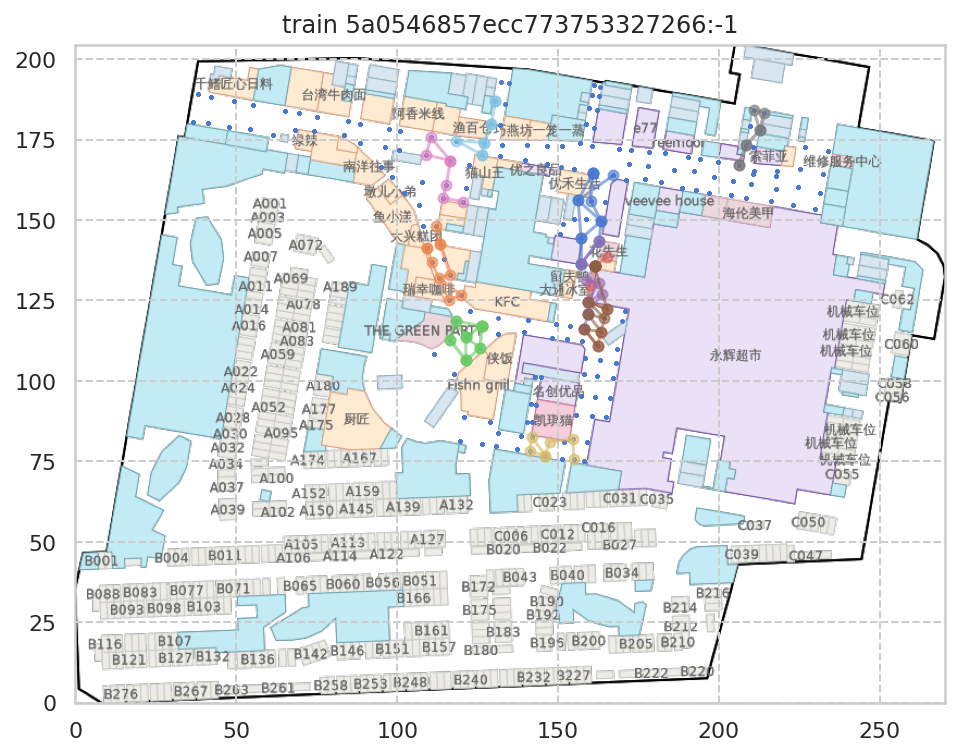

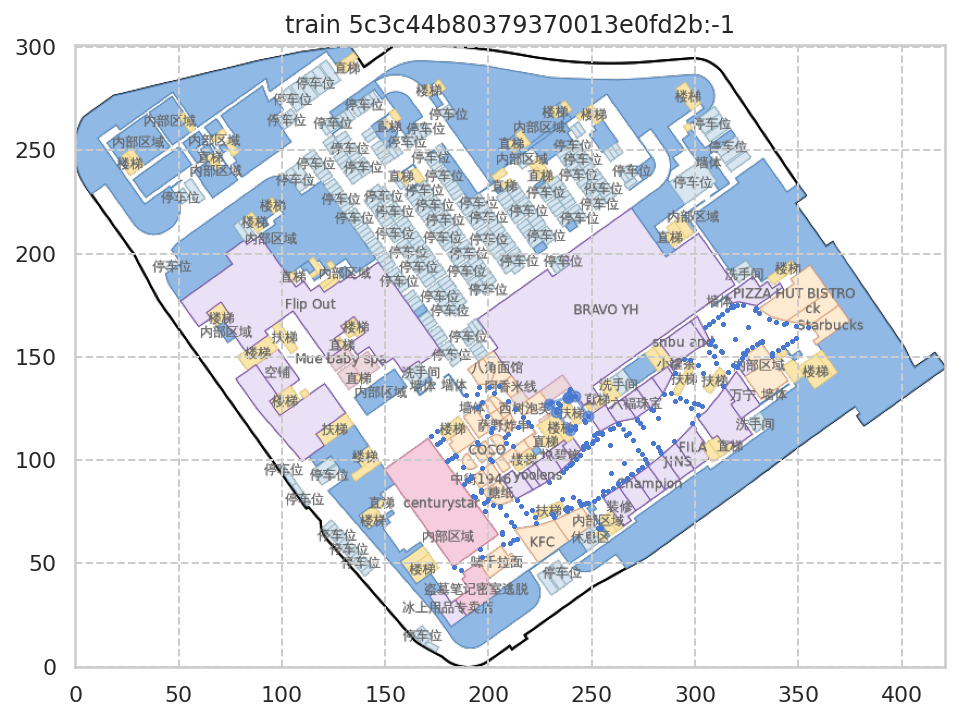

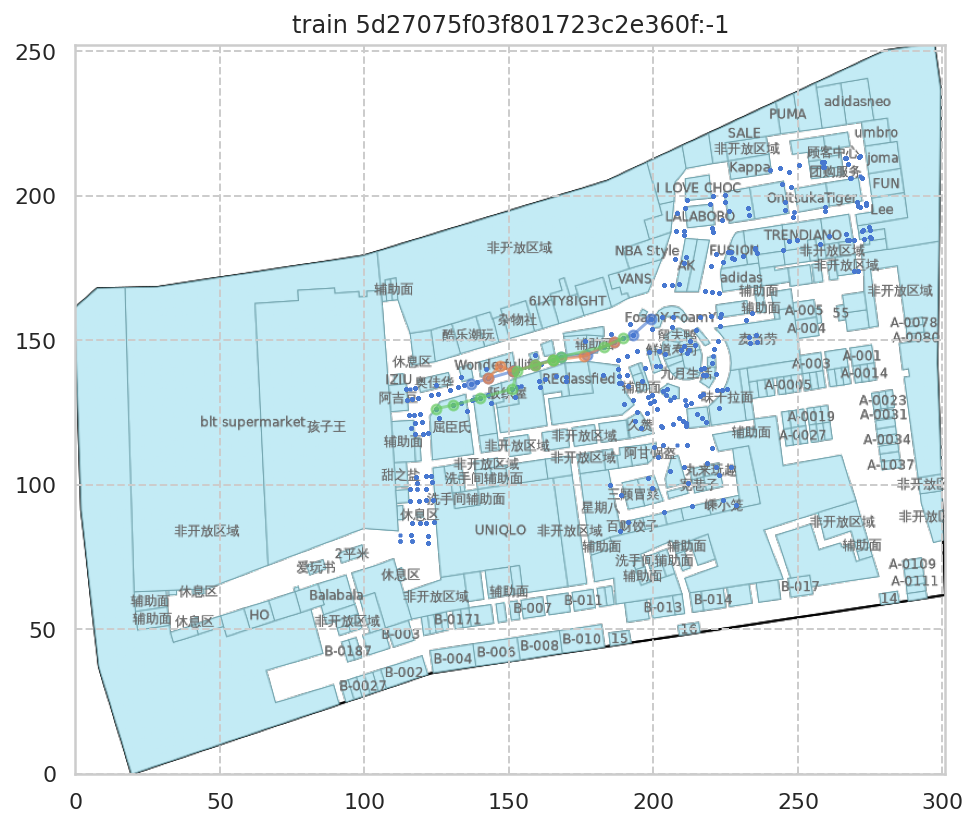

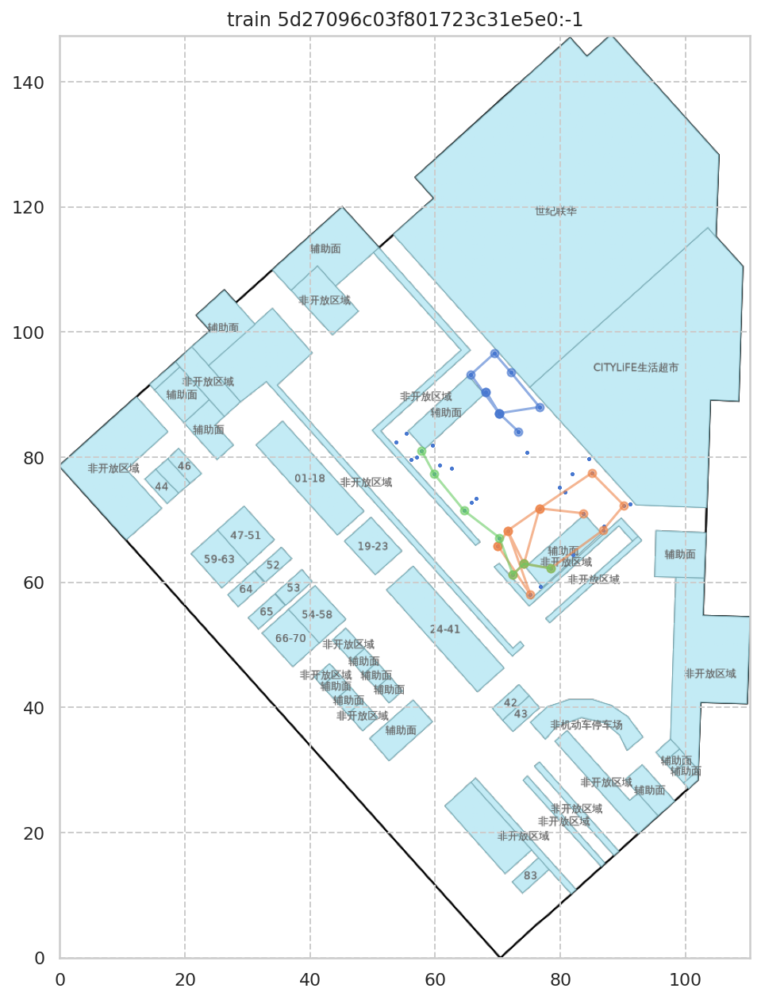

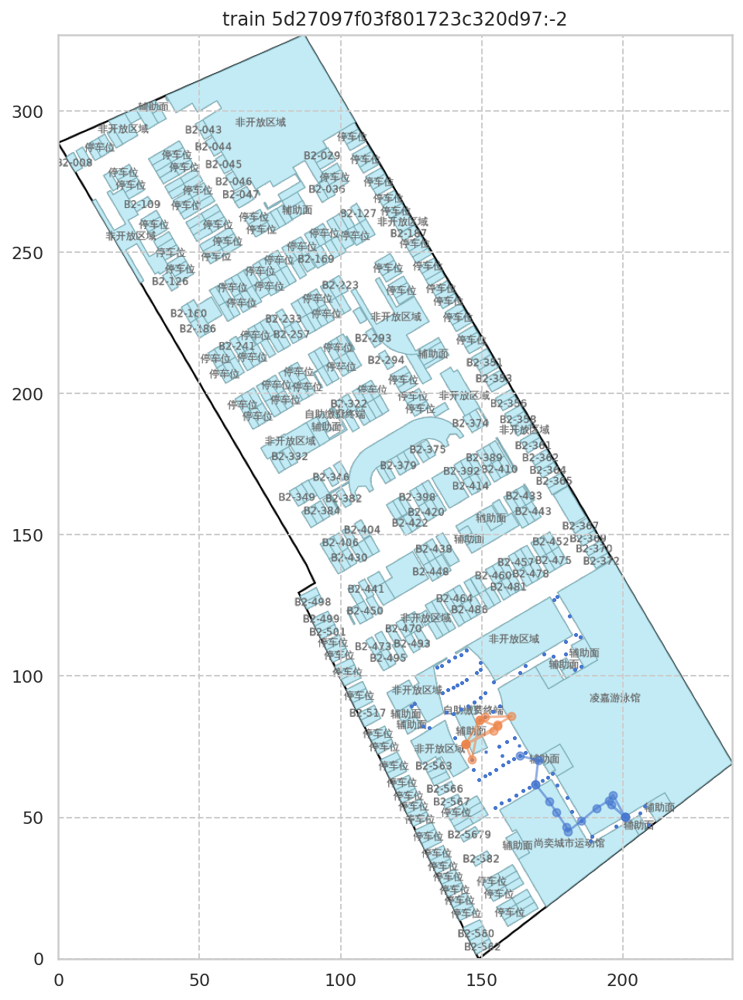

...

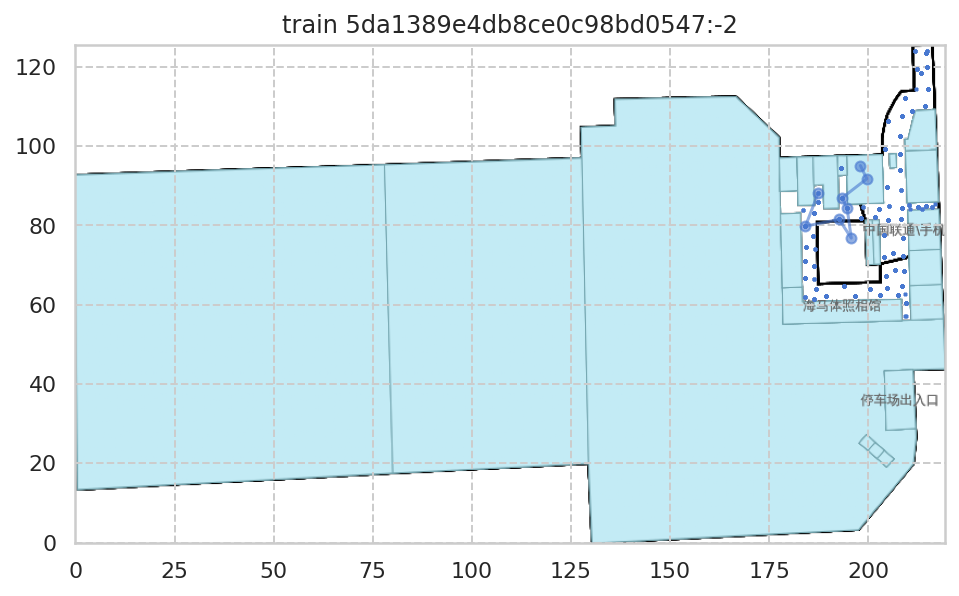

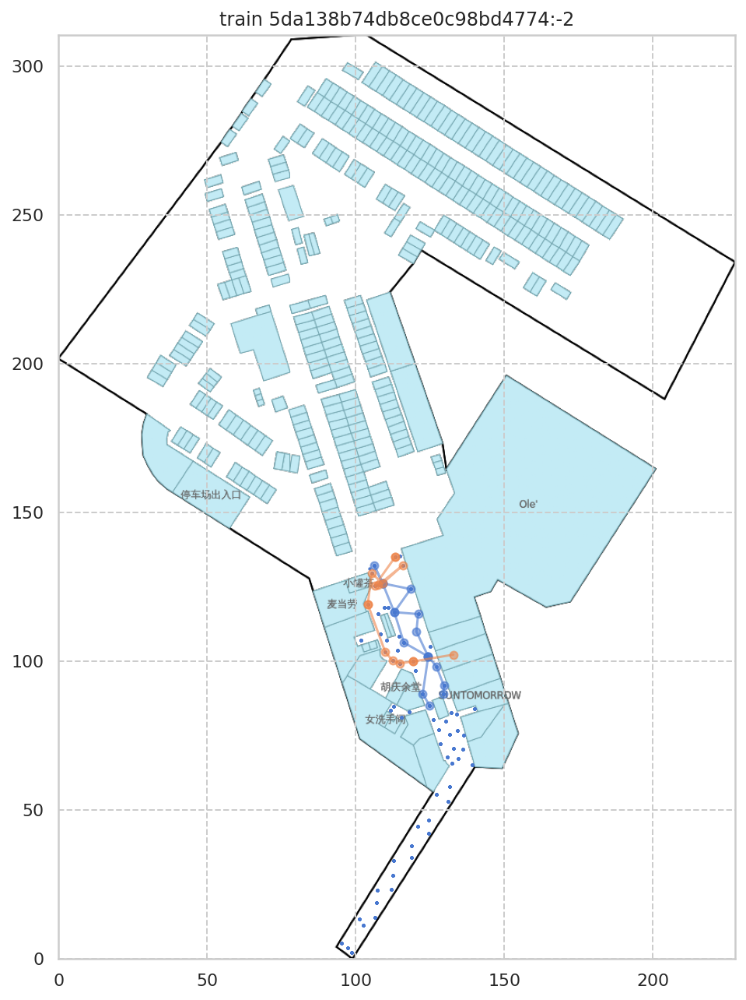

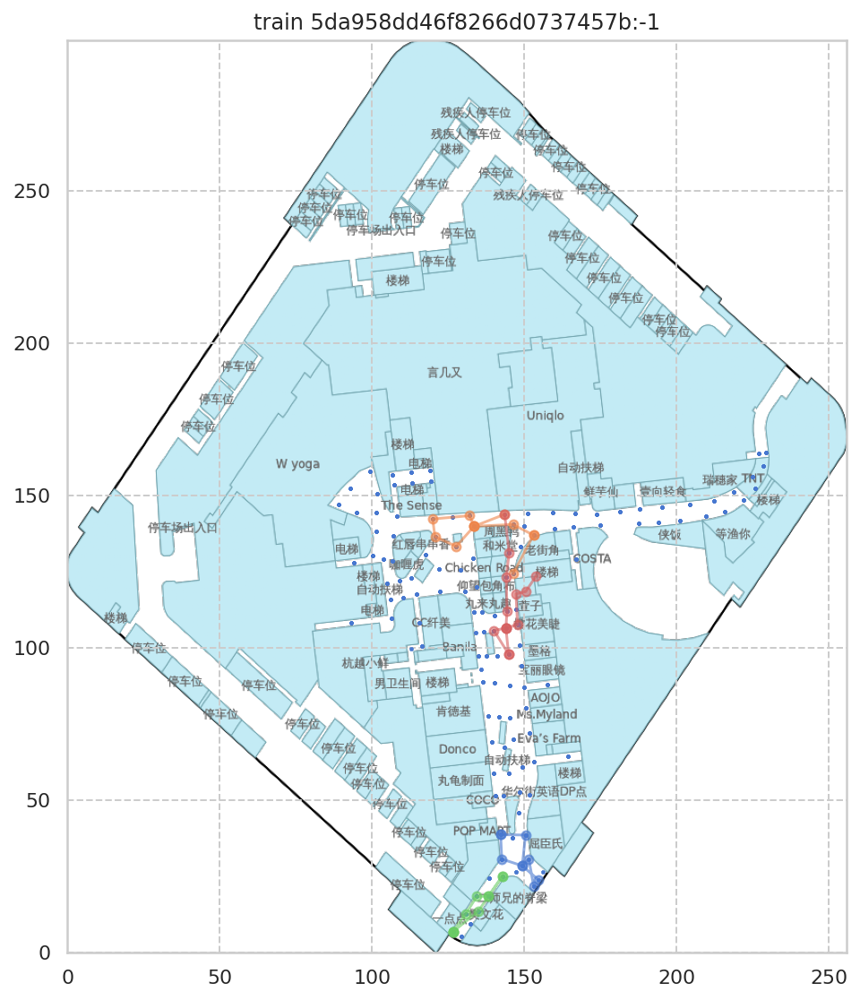

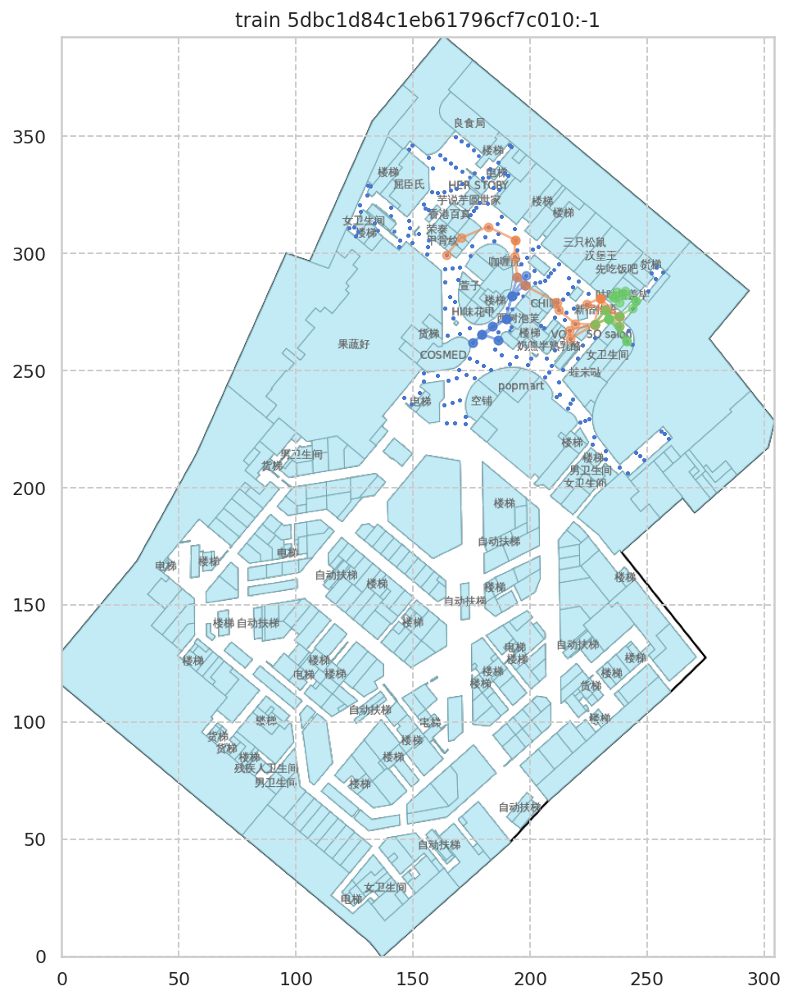

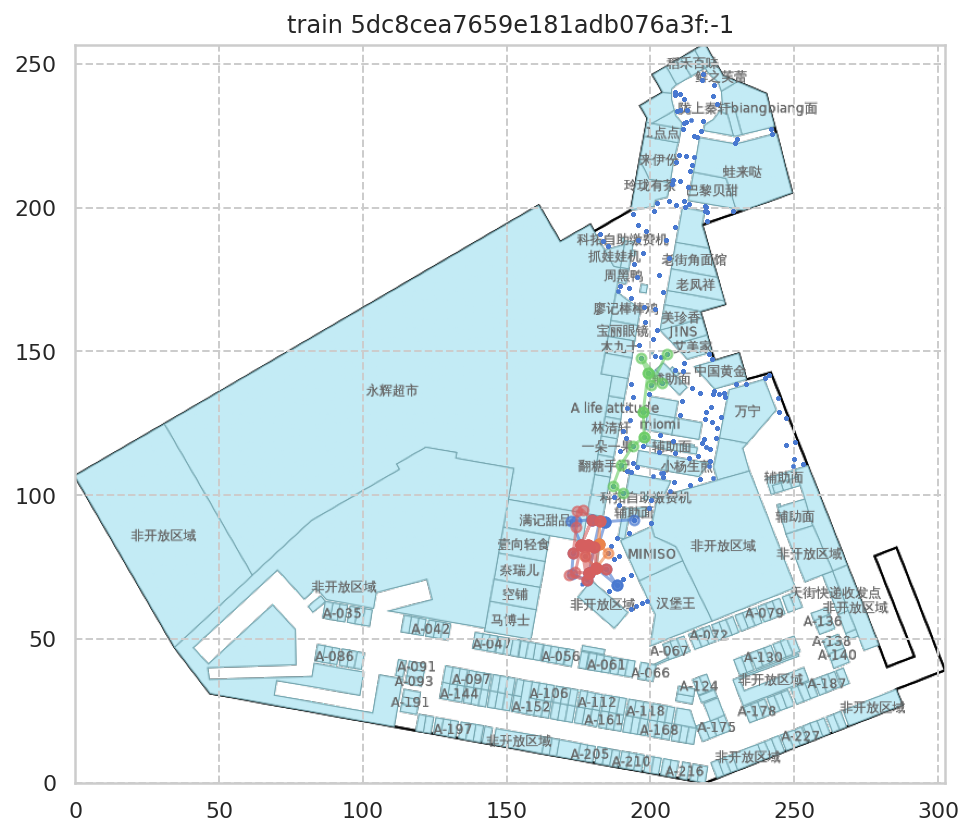

In [24]:
for i, site_id in enumerate(pred_df.site.unique()):

    sample_df = pred_df.query("site == @site_id")
    train_df = pd.read_csv(f'{train_dir}/{site_id}_train.csv')
    
    for floor_id in sample_df['floor'].unique():
        floor_df = sample_df[sample_df['floor'] == floor_id].reset_index(drop=True)

        for fstr in reconv[floor_id]:
            sample_map = SiteInfo(site_id, fstr)
            try:
                sample_map.get_site_info()
            except:
                pass
            else:
                break

        plt.figure(figsize=(8, 8*sample_map.site_height / sample_map.site_width))
        #plt.subplot(121)
        
        sample_map.show_site_image()

        for _, g in floor_df.groupby("path"):
            plt.plot(g.x, g.y, "-o", alpha=0.6,  zorder=100, markersize=5 )
            
#        plt.title(f'pred {site_id}:{floor_id}')
        
        sample_train = train_df.query('f == @floor_id')
        
#        plt.subplot(122)
#        sample_map.show_site_image()
        
        #for _, g in sample_train.groupby("path"):
        #    plt.plot(g.x, g.y, "-o", alpha=0.6,  zorder=100, markersize=5)
        
        plt.scatter(sample_train.x, sample_train.y, marker='+', s=3)
        plt.title(f'train {site_id}:{floor_id}')
        
        # show all floor in this site
        break 
    #break